# Object Detection Overview
-  Object detection involves identifying the location and class of objects in images or video streams. Its output includes bounding boxes enclosing each object, along with class labels and confidence scores. This method is ideal for pinpointing objects in a scene when exact shape details are unnecessary. Among the leading models for this task are RCNNs, SSDs and YOLO. Currently, YOLO models excel, outperforming others in balancing speed and accuracy, particularly in real-time detection scenarios.



# YOLO The Real-Time Object Detection Revolution
- YOLO, short for You Only Look Once, revolutionizes object detection in computer vision by offering a fast and streamlined approach. It uniquely simplifies the detection process, treating it as a single-step task that combines object localization and classification. This innovative method allows YOLO to process images and videos in real time with high accuracy. The latest version, YOLOv8, further enhances this technology, adeptly tackling challenges in object detection and image segmentation. YOLO’s real-time capabilities make it a standout choice for applications needing rapid and precise object identification.

# YOLOv8: Advancing the Frontiers of Object Detection
- Launched in January 2023 by Ultralytics, YOLOv8 is the latest advancement in the YOLO series designed for classification, object detection, and image segmentation, with documented release on January 10, 2023.
- It emphasizes speed and accuracy, introducing an anchor‑free detection head that directly predicts boxes per location, improving efficiency over anchor‑based designs.
- Official materials describe updated backbones and necks rather than strictly Darknet53, though community summaries often reference CSP/Darknet‑style variants; the model family focuses on optimized accuracy‑speed trade‑offs across tasks.
- Reported performance across YOLOv8 variants includes strong COCO mAP, but exact figures depend on the specific model size and settings; representative docs list mAP values per variant rather than a single universal number.

# Traffic Density Estimation Project Overview
- Leveraging YOLO’s real‑time detection, this project targets Traffic Density Estimation by counting vehicles within a defined region of each frame to quantify density and flow. The resulting metrics help surface peak periods and congested segments, supporting decisions in traffic operations and urban planning. The intended outcome is a practical toolkit that analyzes traffic patterns and delivers actionable insights for management and city planning


# Project Objectives
- YOLOv8 model selection and baseline check on a COCO‑pretrained weight to assess initial vehicle detection performance.

- Specialized vehicle dataset curation and annotation to cover diverse vehicle classes and viewpoints for better generalization.

- Transfer‑learning fine‑tuning of YOLOv8 with emphasis on aerial perspectives to improve precision and recall for vehicle categories.

- Comprehensive evaluation using learning curves, confusion matrix, and standard metrics (mAP, precision, recall) to validate accuracy and generalization.

- Inference on validation images, an unseen test image, and a test video to demonstrate practical robustness and generalization.

- Real‑time traffic density estimation by counting detected vehicles per frame and aggregating over time to measure intensity.

- Cross‑platform deployment by exporting the fine‑tuned model to ONNX for interoperability across environments.


# contents_tabel  

Step 1 | Setup and Initialization. 

Step 2 | Loading YOLOv8 Pre‑trained Model. 

Step 3 | Dataset Exploration. 

Step 4 | Fine‑Tuning YOLOv8. 

Step 5 | Model Performance Evaluation. 

Step 5.1 | Learning Curves Analysis. 

Step 5.2 | Confusion Matrix Evaluation. 

Step 5.3 | Performance Metrics Assessment. 

Step 6 | Model Inference & Generalization Assessment. 

Step 6.1 | Inference on Validation Set Images. 

Step 6.2 | Inference on an Unseen Test Image. 

Step 6.3 | Inference on an Unseen Test Video. 

Step 7 | Real‑Time Traffic Intensity Estimation.


# Step 1 | Setup and Initialization


- YOLOv8 is the first version of the YOLO series to offer an official package that can be easily installed using pip. This streamlines the setup process, a notable advancement from previous versions that required cloning repositories and running scripts. Let's begin by installing the Ultralytics package

In [2]:
# Install Ultralytics library
!pip install ultralytics

- Then, let's import all the essential libraries needed for our project


In [3]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

# Step 2 | Loading YOLOv8 Pre-trained Model

- Here are the pre-trained YOLOv8 object detection models, which have been trained on the COCO dataset. The Common Objects in Context (COCO) dataset is extensive, designed for object detection, segmentation, and captioning, and encompasses <a href="https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/datasets/coco.yaml">80 diverse object categories.


<img src="https://github.com/FarzadNekouee/YOLOv8_Traffic_Density_Estimation/blob/master/images/YOLOv8_object_detection_models.jpg?raw=true" width="2400">

# Model Performance Trade-offs
    
- The YOLOv8 suite presents five distinct models: nano, small, medium<,large, and xlarge. A clear trend emerges from the data: as model size increases, there's a notable improvement in mAP, indicating enhanced accuracy. Conversely, this augmentation comes at the cost of speed, with larger models being slower. All models adhere to a standard input size of 640x640 pixels, optimizing performance across diverse applications.


# Intersection Over Union (IoU)
- IoU is a metric used to evaluate the accuracy of an object detector on a particular dataset. It measures the overlap between the predicted bounding box and the ground truth, with values ranging from 0 (no overlap) to 1 (perfect overlap). IoU is crucial for determining whether a detection is a true positive or a false positive, often using a threshold like 0.5 or 0.75 to make this distinction.
# Mean Average Precision 
- mAP is a commonly used metric to evaluate the precision of object detection models. It is the average of the AP (Average Precision) calculated for all the classes and is based on the area under the precision-recall curve. This metric reflects the model's precision across different levels of recall, providing a comprehensive performance measure that accounts for both the detection accuracy and the ability to detect all relevant objects.
 


- For our real-time traffic density estimation application, I am going to select the YOLOv8 nano pre-trained model (yolov8n.pt) to handle vehicle detection. This model ensures the fastest possible inference time, making it well-suited for real-time use.

In [5]:
# Load a pretrained YOLOv8n model from Ultralytics
model = YOLO('yolov8n.pt')

- The pre-trained model we've loaded is trained on the COCO dataset, which includes the 'car' and 'truck' classes among its 80 different categories — exactly what we need for our project. Now, let's put our model to the test and see how it performs on a sample image


image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 5 cars, 115.3ms
Speed: 9.9ms preprocess, 115.3ms inference, 210.0ms postprocess per image at shape (1, 3, 384, 640)


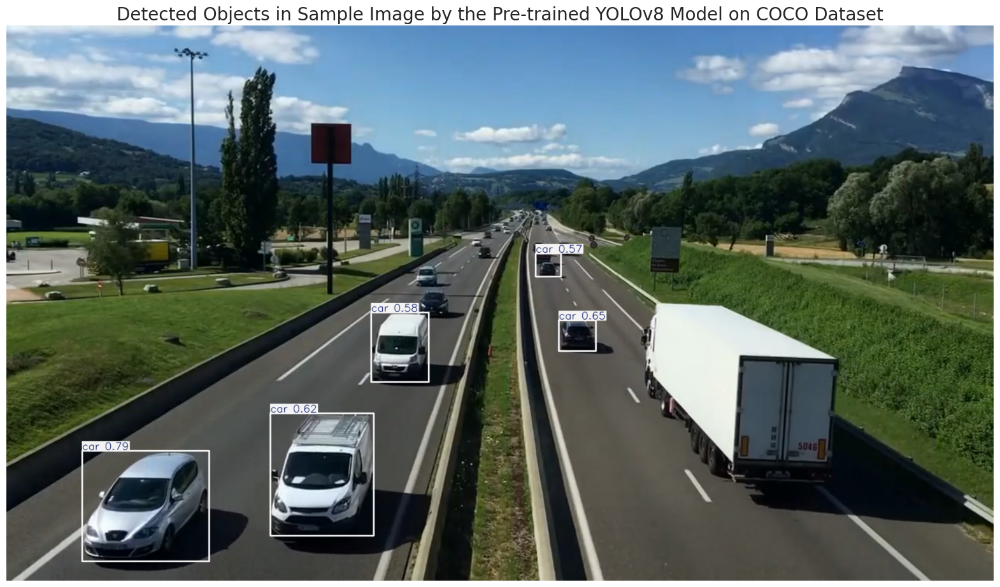

In [6]:
# Path to the image file
image_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image(s)
results = model.predict(source=image_path, 
                        imgsz=640,  # Resize image to 640x640 (the size pf images the model was trained on)
                        conf=0.5)   # Confidence threshold: 50% (only detections above 50% confidence will be considered)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Pre-trained YOLOv8 Model on COCO Dataset', fontsize=20)
plt.axis('off')
plt.show()

# Pre-trained Model Detection Analysis
- In our sample image, the pre-trained model missed the detectable truck and car that were clearly visible. A model pre-trained on a dataset with a broad range of classes, like COCO's 80 different categories, may not perform as well on a specific subset of those categories due to the diversity of objects it has been trained to recognize. If we fine-tune this model on a specialized dataset that focuses solely on vehicles, it can learn to detect various types of vehicles more accurately. Fine-tuning on a vehicle-specific dataset allows the model to become more specialized, adjusting the weights to be more sensitive to features specific to vehicles. As a result, the model's mean Average Precision (mAP) for vehicle detection could improve because it's being optimized on a narrower, more relevant range of classes for our specific application. Fine-tuning also helps the model generalize better for vehicle detection tasks, potentially reducing false negatives (like missing a detectable truck) and improving overall detection performance.



# Step 3 | Dataset Exploration

# Dataset Preparation for Model Fine-tuning
- A specialized top‑view vehicle dataset is hosted on Kaggle under “Top‑View Vehicle Detection Image Dataset for YOLOv8,” focused on a single class, Vehicle, spanning cars, trucks, and buses with 626 images annotated in YOLOv8 format.

- Images are standardized to 640×640 resolution; training split includes 536 augmented images while validation has 90 images left unaugmented for fair evaluation.

- Source material was curated from Pexels videos, with frames sampled at approximately 1 frame per second and annotated using Roboflow tools for efficient labeling and export to YOLOv8 structure.

# YOLOv8 Dataset Format
- Train directory: Contains a train/images folder with 536 images and a train/labels folder with matching YOLO text labels.

- Validation directory: Contains a valid/images folder with 90 images and a valid/labels folder with corresponding labels.

- data.yaml: Specifies dataset paths, number of classes, and class names; for example, nc: 1 and names: ['Vehicle'] with train and val paths pointing to the images subfolders.

- Label files: One .txt per image; each row is class x_center y_center width height with all coordinates normalized to ; images without objects may have no label file.


Let's begin our exploration by examining the data.yaml file.

In [7]:
# Define the dataset_path
dataset_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset'

# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



# Understanding the data.yaml File
- As I previously mentioned, the 'data.yaml' file is a key part of setting up our model. It points out where to find the training and validation images and tells the model that we're focusing on just one class, named 'Vehicle'. This file is essential for making sure our Ultralytics YOLOv8 model learns from our specific dataset, as it guides the model to understand exactly what it needs to look for and where.


Now, let's continue our exploration by counting the images in both the training and validation sets and verifying their sizes

In [8]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):  
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'): 
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 536
Number of validation images: 90
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


# Analysis Insights
    
- The dataset for our project consists of 536 training images and 90 validation images, all uniformly sized at 640x640 pixels. This size aligns with the benchmark standard for the YOLOv8 model, ensuring optimal accuracy and speed during model performance. The split ratio of approximately 85% for training and 15% for validation provides a substantial amount of data for model learning while retaining enough images for effective model validation.
    

Let's take a look at a few images from the training dataset to get a sense of what the data looks like.

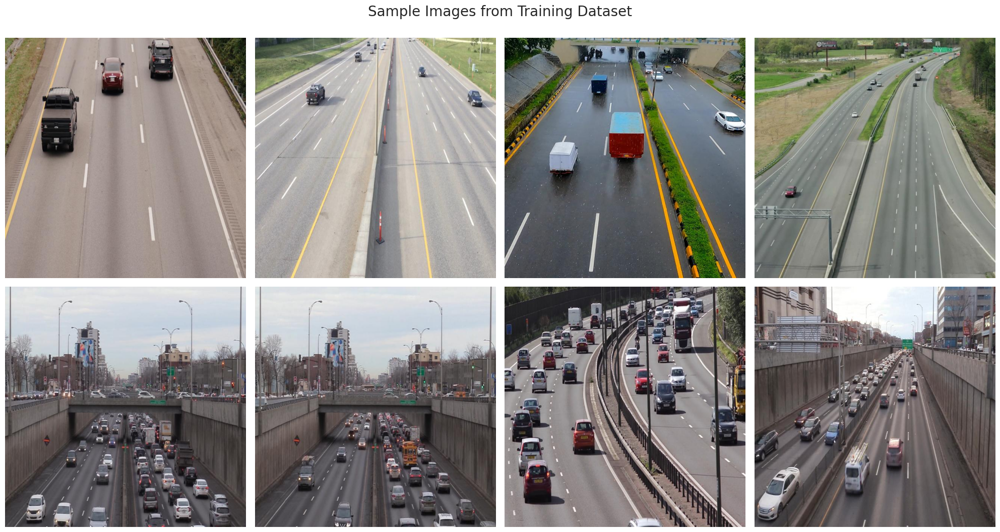

In [9]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')  

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

# Step 4 | Fine-Tuning YOLOv8

- In this step of our project, we're set to fine-tune our YOLOv8 pre-trained object detection model using transfer learning, specifically tailoring it to our 'Top-View Vehicle Detection Image Dataset'. By leveraging the YOLOv8 model's existing weights from its training on the comprehensive COCO dataset, we start from a robust foundation rather than from scratch. This approach not only saves significant time and resources but also capitalizes on our focused dataset to enhance the model's ability to accurately recognize and detect vehicles in top-view images. This method of training enables efficient and effective model adaptation, ensuring it's finely attuned to the specificities of vehicle detection from aerial perspectives.

In [10]:
# Train the model on our custom dataset
results = model.train(
    data=yaml_file_path,     # Path to the dataset configuration file
    epochs=100,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    device=0,                # Device to run on, i.e. cuda device=0 
    patience=50,             # Epochs to wait for no observable improvement for early stopping of training
    batch=32,                # Number of images per batch
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate 
    lrf=0.1,                 # Final learning rate (lr0 * lrf)
    dropout=0.1,             # Use dropout regularization
    seed=0                   # Random seed for reproducibility
)

Ultralytics 8.3.189 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_ma

2025-08-30 10:41:57,764	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2025-08-30 10:41:58,222	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

# Integration of Weights & Biases (Wandb) with YOLOv8
    
- Weights & Biases, known as wandb.ai , is an MLOps tool that works seamlessly with Ultralytics, including the YOLOv8 model. When we train our YOLOv8 model, wandb.ai helps to manage our machine learning experiments by monitoring the training process, logging important metrics, and saving outputs. It's like a dashboard where we can see how our model is learning, with all the details and visualizations to help us understand the training progress and results.
  
- Providing the API Key
- During the model training, an API key is required for Weights & Biases to track and store our model's data. We'll be prompted to sign up at href="https://wandb.ai/authorize" https://wandb.ai/authorize to get this key. After signing up, we copy the API key provided and paste it back into our training setup. This key connects our training session to the Weights & Biases platform, allowing us to access all the great features for monitoring and evaluating our model.



# Understanding Run Summary Metrics.
- Learning rate per group (lr/pg0, lr/pg1, lr/pg2): Separate optimizers or parameter groups often use distinct learning rates; lower values slow weight updates, while consistent values imply uniform update magnitudes.

- Mean Average Precision at 50% IoU (metrics/mAP50(B)): Accuracy measured at IoU ≥ 0.5; values near 0.97 indicate very strong detection performance at this threshold.

- Mean Average Precision across IoU 50%–95% (metrics/mAP50-95(B)): COCO primary metric averaging AP over IoU thresholds 0.50:0.95; a value around 0.74 reflects solid overall performance.

- Precision (metrics/precision(B)): Proportion of predicted positives that are correct, reflecting false‑positive control; 0.92 denotes high precision.

- Recall (metrics/recall(B)): Proportion of actual positives detected, reflecting missed detections; 0.94 denotes strong sensitivity.

- Model computational complexity (model/GFLOPs): Estimated floating‑point operations for a forward pass, indicating compute demand and correlating with speed.

- Model parameters: Count of trainable weights; values near 3M correspond to compact variants with moderate capacity.

- Inference speed (model/speed_PyTorch(ms)): Per‑image latency on a given device/backend; values near 4.6 ms suggest real‑time throughput on capable GPUs.

- Training losses (train/box_loss, train/cls_loss, train/dfl_loss): Bounding‑box regression loss, classification loss, and distribution focal loss used in YOLOv8; lower is better.

- Validation losses (val/box_loss, val/cls_loss, val/dfl_loss): Same losses computed on validation data to assess generalization; similar train/val magnitudes indicate low overfitting


# Step 5 | Model Performance Evaluation 

- Post-training, our model generates several files and folders that encapsulate various aspects of the training run. Let's see the list of generated files:

In [11]:
# Define the path to the directory
post_training_files_path = '/kaggle/working/runs/detect/train'

# List the files in the directory
!ls {post_training_files_path}

BoxF1_curve.png			 labels.jpg	      train_batch1532.jpg
BoxPR_curve.png			 results.csv	      train_batch2.jpg
BoxP_curve.png			 results.png	      val_batch0_labels.jpg
BoxR_curve.png			 train_batch0.jpg     val_batch0_pred.jpg
args.yaml			 train_batch1.jpg     val_batch1_labels.jpg
confusion_matrix.png		 train_batch1530.jpg  val_batch1_pred.jpg
confusion_matrix_normalized.png  train_batch1531.jpg  weights


# Training Output Files Explained
- Here’s a rundown of each item:
- Weights folder: Contains best.pt and last.pt, representing the best checkpoint (by validation metric) and the most recent checkpoint of the training run.

- Args: Stores the training arguments and hyperparameters used for the run to enable reproducibility.

- Confusion matrix: Images summarizing per‑class performance; normalized variants highlight true positive rates across classes.

- Events file: Training logs written for visualization/debugging (for example, TensorBoard events), useful for tracing issues.

- F1 curve: Plot tracking the F1 score evolution to balance precision and recall over thresholds or epochs.

- Labels: Visualizations showing class distribution and relationships to help assess dataset balance.

- P, PR, and R curves: Precision, Precision‑Recall, and Recall curves to study threshold‑dependent trade‑offs.

- results.csv: A CSV logging epoch‑wise metrics, losses, and timings for the entire training process.

- Train batch images: Sample training images with model predictions overlaid for quick qualitative checks.

- Validation batch images: Validation samples with labels and predictions for a snapshot of generalization quality.

- I will undertake a comprehensive evaluation and analysis of our model's performance, which involves:

- Learning Curves Analysis
- Confusion Matrix Evaluation
- Performance Metrics Assessment
   

# Step 5.1 Learning Curves Analysis

- In this step, let's review the training and validation loss trends over epochs to assess the learning stability and efficiency:</p>


In [12]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

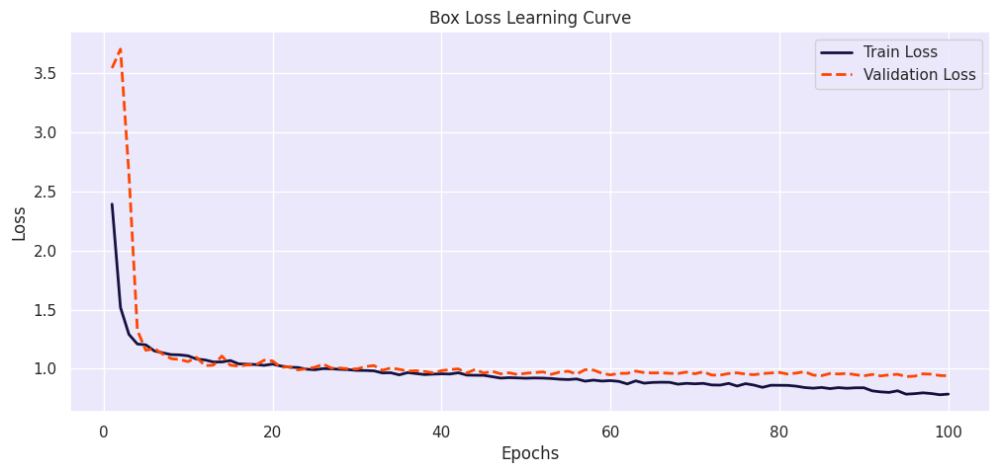

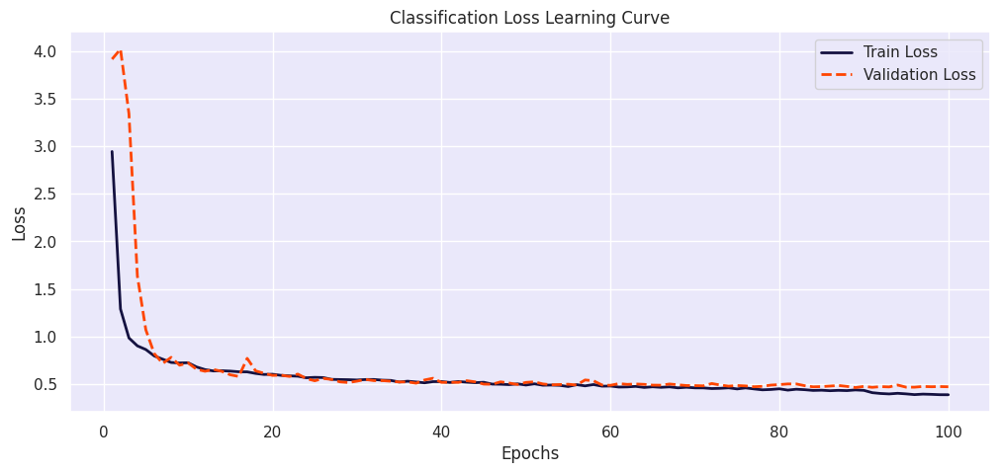

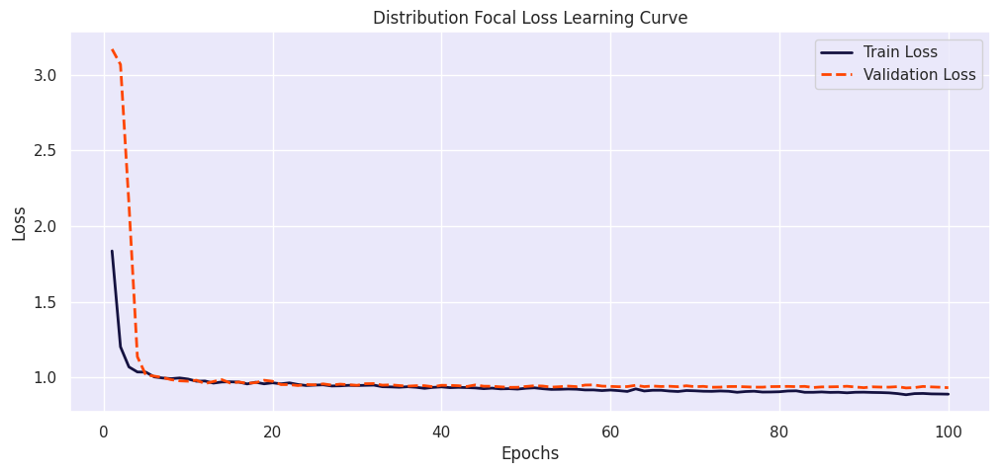

In [13]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

# Model Learning Curve Analysis

- The learning curves for box loss, classification loss, and distribution focal loss indicate a rapid decrease in loss values during the initial epochs, leveling off as training progresses. This trend, along with the close alignment of training and validation loss lines, suggests that the model is learning effectively without overfitting, meaning it is well-tuned to the dataset without being biased or too variable.


- The smoothness of the learning curves, especially evident in the latter epochs, implies that the model is reaching a state of equilibrium, where additional training does not significantly enhance performance. This observation suggests that 100 epochs are sufficient for training this model, as further training is unlikely to result in substantial gains.


# Step 5.2 Confusion Matrix Evaluation

- Next, I will focus on displaying and meticulously analyzing the confusion matrix derived from our model's performance on the validation dataset:


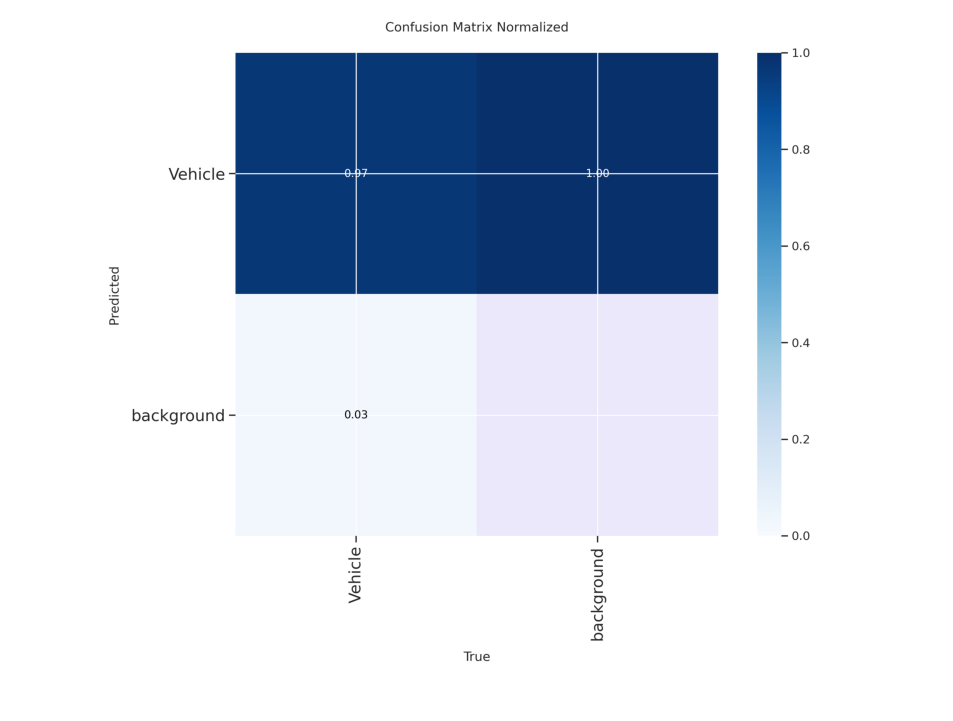

In [14]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

# Confusion Matrix Analysis

- The confusion matrix for our YOLOv8 vehicle detection model illustrates high accuracy as mentioned earlier as well. In 97% of instances, the model successfully identifies the presence of a vehicle when there is one, indicating strong detection capability. Conversely, in just 3% of cases, the model fails to detect a vehicle that is actually present, suggesting room for improvement in reducing false negatives.



# Step 5.3 Performance Metrics Assessment.

Finally, I am delving into various metrics to understand the model's predictive accuracy and areas of potential improvement

In [15]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.189 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.7±0.3 ms, read: 120.1±25.8 MB/s, size: 61.7 KB)
val: Scanning /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/labels... 90 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 90/90 746.9it/s 0.1s
WARNING ⚠️ val: Cache directory /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 0.77it/s 7.8s
                   all         90        937      0.912      0.933      0.971      0.741
Speed: 3.7ms preprocess, 27.4ms inference, 0.0ms loss, 15.6ms postprocess per image
Results saved to runs/detect/val


as can be seen in the above verbose

In [16]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.912
metrics/recall(B),0.933
metrics/mAP50(B),0.971
metrics/mAP50-95(B),0.741
fitness,0.764


# Model Evaluation Insights
    
- The YOLOv8 model shows impressive results on the validation set. With a precision of 91.6%, it indicates that the majority of the predictions made by the model are correct. The recall score of 93.8% demonstrates the model's ability to find most of the relevant cases in the dataset. The model's mean Average Precision (mAP) at 50% Intersection over Union (IoU) is 97.5% reflecting high accuracy in detecting objects with a considerable overlap with the ground truth. Even when the IoU threshold range is expanded from 50% to 95%, the model maintains a solid mAP of 74.2%. 
- Finally, the fitness score of 76.5% indicates a good balance between precision, recall, and the IoU of the predictions, confirming the model's effectiveness in object detection tasks.



# Step 6 | Model Inference & Generalization Assessment 

- To thoroughly assess our model's capability to generalize, I will conduct inferences in three distinct steps:
    
- Inference on Validation Set Images
- Inference on an Unseen Test Image
- Inference on an Unseen Test Video.



# Step 6.1  Inference on Validation Set Images

- First of all, I am going to evaluate model predictions on random images from the validation dataset.


image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/6_mp4-0_jpg.rf.9a055d040151678e04cb48a8bde76f55.jpg: 640x640 4 Vehicles, 4.9ms
Speed: 1.4ms preprocess, 4.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/4_mp4-7_jpg.rf.439bc6176789cd7ca6bd686e23fc5ddf.jpg: 640x640 18 Vehicles, 5.0ms
Speed: 1.4ms preprocess, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/6_mp4-14_jpg.rf.a5099c3eeb2c707a2193c0efa467bb2a.jpg: 640x640 3 Vehicles, 4.8ms
Speed: 1.3ms preprocess, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/11_mp4-15_jpg.rf.b1bdb8b4864b

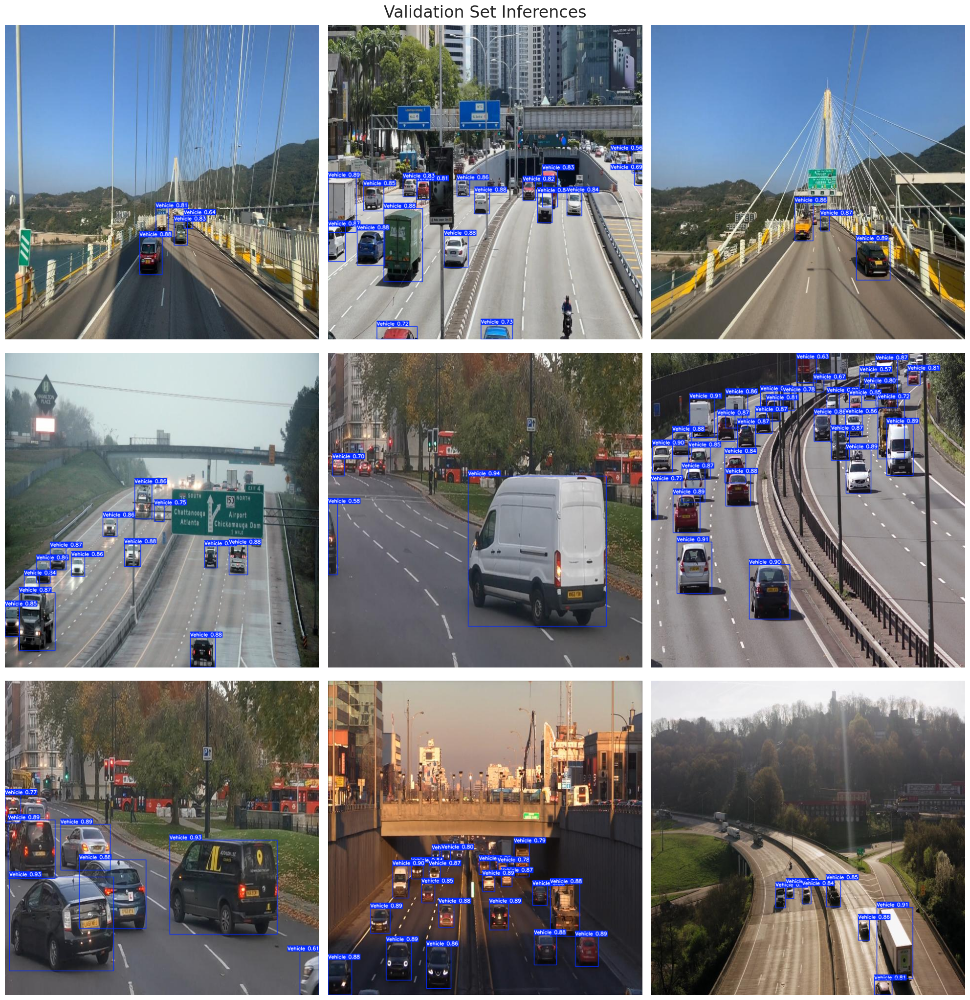

In [17]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Step 6.2 Inference on an Unseen Test Image

- Now, I will employ the best version of our fine-tuned model to evaluate its generalization capabilities. I'll test it on the same image previously analyzed using the pre-trained YOLOv8 model on the COCO dataset:



image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 7 Vehicles, 10.7ms
Speed: 2.0ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


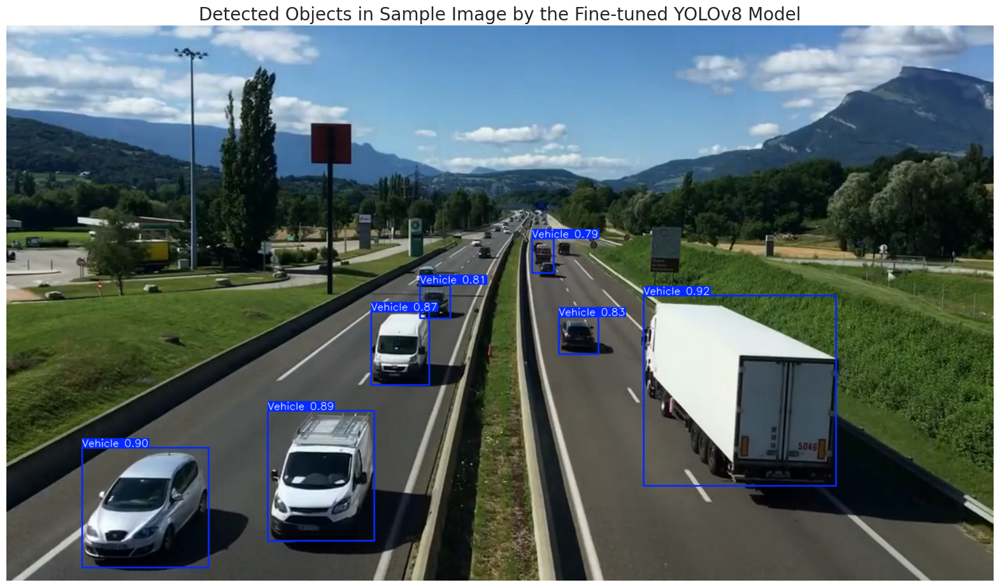

In [18]:
# Path to the image file
sample_image_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image using best model
results = best_model.predict(source=sample_image_path, imgsz=640, conf=0.7) 
                        
# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Fine-tuned YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()

- Enhanced Vehicle Detection with Fine-Tuning
        - The comparison between the above image with the image we had in step 2 clearly demonstrates the benefits of fine-tuning the YOLOv8 model for a specialized task. In the image from step 2, the pre-trained model on the COCO dataset missed detecting a truck and misclassified it, indicating limitations when dealing with a specific class of objects due to its broader training scope. In contrast, the above image shows that the fine-tuned model on a vehicle-specific dataset has accurately detected and classified various vehicles, including the previously missed truck. This improvement highlights the model's enhanced capability to discern features specific to vehicles, leading to better precision and recall in vehicle detection.
   

# Step 6.3 Inference on an Unseen Test Video

- Finally, I am going to assess the model's generalization capabilities on a completely new video, unseen during training. This step is crucial to demonstrate the model's ability to adapt and perform accurately in real-world applications, further solidifying its effectiveness outside of the controlled dataset environment:


In [19]:
# Define the path to the sample video in the dataset
dataset_video_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_video.mp4'

# Define the destination path in the working directory
video_path = '/kaggle/working/sample_video.mp4'

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/601) /kaggle/working/sample_video.mp4: 384x640 6 Vehicles, 6.3ms
video 1/1 (frame 2/601) /kaggle/working/sample_video.mp4: 384x640 5 Vehicles, 6.6ms
video 1/1 (frame 3/601) /kaggle/working/sample_video.mp4: 384x640 6 Vehicles, 7.0ms
video 1/1 (frame 4/601) /kaggle/working/sample_video.mp4: 384x640 6 Vehicles, 5.7ms
video 1/1 (frame 5/601) /kaggle/working/sample_video.mp4: 384x640 6 Vehicles, 6.5ms
video 1/1 (frame 6/601) /kaggle/work

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Vehicle'}
 obb: None
 orig_img: array([[[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[254, 246, 241],
         [254, 246, 241],
         [254, 246, 241],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        ...,
 
        [[ 94, 104, 103],
         [ 96, 106, 105],
         [101, 111, 110],
         ...,
         [ 94, 106, 111],
         [ 95, 107, 112],
         [ 97, 109, 114]],
 
        [[ 98, 108, 107],
         [103, 113, 112],
         [100, 110, 109],
         ...,
         [ 95, 10

- To ensure compatibility with various platforms, including Jupyter Notebooks, we'll convert the output .avi video file to the more universally supported .mp4 format and then display it within the notebook environment:


# Step 7 | Real-Time Traffic Intensity Estimation


- As the project moves into practical deployment, a fine‑tuned vehicle detection model is applied to analyze traffic density on unseen videos to validate generalization and accuracy. The aim is to count vehicles within defined lane regions frame‑by‑frame to quantify density and label traffic intensity as Heavy or Smooth using a set threshold, informing planning and management. Although real‑time execution is not feasible in Kaggle, the code simulates real‑time by processing frames, applying detection, annotating outputs, and saving an annotated video; true real‑time can be run locally on CPUs or webcams. The following code section implements this workflow end‑to‑end for offline evaluation and later real‑time deployment.

In [21]:
# Define the threshold for considering traffic as heavy
heavy_traffic_threshold = 10

# Define the vertices for the quadrilaterals
vertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)
vertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)

# Define the vertical range for the slice and lane threshold
x1, x2 = 325, 635 
lane_threshold = 609

# Define the positions for the text annotations on the image
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)

# Define font, scale, and colors for the annotations
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text
        
# Open the video
cap = cv2.VideoCapture('sample_video.mp4')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('traffic_density_analysis.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

# Read until video is completed
while cap.isOpened():
    # Capture frame-by-frame
    ret, frame = cap.read()
    if ret:
        # Create a copy of the original frame to modify
        detection_frame = frame.copy()
    
        # Black out the regions outside the specified vertical range
        detection_frame[:x1, :] = 0  # Black out from top to x1
        detection_frame[x2:, :] = 0  # Black out from x2 to the bottom of the frame
        
        # Perform inference on the modified frame
        results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
        processed_frame = results[0].plot(line_width=1)
        
        # Restore the original top and bottom parts of the frame
        processed_frame[:x1, :] = frame[:x1, :].copy()
        processed_frame[x2:, :] = frame[x2:, :].copy()        
        
        # Draw the quadrilaterals on the processed frame
        cv2.polylines(processed_frame, [vertices1], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.polylines(processed_frame, [vertices2], isClosed=True, color=(255, 0, 0), thickness=2)
        
        # Retrieve the bounding boxes from the results
        bounding_boxes = results[0].boxes

        # Initialize counters for vehicles in each lane
        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0

        # Loop through each bounding box to count vehicles in each lane
        for box in bounding_boxes.xyxy:
            # Check if the vehicle is in the left lane based on the x-coordinate of the bounding box
            if box[0] < lane_threshold:
                vehicles_in_left_lane += 1
            else:
                vehicles_in_right_lane += 1
                
        # Determine the traffic intensity for the left lane
        traffic_intensity_left = "Heavy" if vehicles_in_left_lane > heavy_traffic_threshold else "Smooth"
        # Determine the traffic intensity for the right lane
        traffic_intensity_right = "Heavy" if vehicles_in_right_lane > heavy_traffic_threshold else "Smooth"


        # Add a background rectangle for the left lane vehicle count
        cv2.rectangle(processed_frame, (text_position_left_lane[0]-10, text_position_left_lane[1] - 25), 
                      (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)

        # Add the vehicle count text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Vehicles in Left Lane: {vehicles_in_left_lane}', text_position_left_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the left lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0]-10, intensity_position_left_lane[1] - 25), 
                      (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)

        # Add the traffic intensity text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_left}', intensity_position_left_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the right lane vehicle count
        cv2.rectangle(processed_frame, (text_position_right_lane[0]-10, text_position_right_lane[1] - 25), 
                      (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)

        # Add the vehicle count text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Vehicles in Right Lane: {vehicles_in_right_lane}', text_position_right_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the right lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_right_lane[0]-10, intensity_position_right_lane[1] - 25), 
                      (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)

        # Add the traffic intensity text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_right}', intensity_position_right_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Write the processed frame to the output video
        out.write(processed_frame)
        
        # Uncomment the following 3 lines if running this code on a local machine to view the real-time processing results
        # cv2.imshow('Real-time Analysis', processed_frame)
        # if cv2.waitKey(1) & 0xFF == ord('q'):  # Press Q on keyboard to exit the loop
        #     break
    else:
        break

# Release the video capture and video write objects
cap.release()
out.release()

# Close all the frames
# cv2.destroyAllWindows()


0: 384x640 (no detections), 8.7ms
Speed: 3.0ms preprocess, 8.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.2ms
Speed: 2.4ms preprocess, 6.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 5.9ms
Speed: 1.9ms preprocess, 5.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.6ms
Speed: 1.6ms preprocess, 6.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 5.8ms
Speed: 1.6ms preprocess, 5.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 5.7ms
Speed: 1.4ms preprocess, 5.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.3ms
Speed: 1.7ms preprocess, 6.3ms inference, 0.6ms 

- Finally, lets convert the output .avi video to .mp4 format for notebook playback and display it
